# Import the necessary libraries

In [2]:
import os
import pandas as pd
from collections import Counter
import monai.transforms as mt
from torch.utils.data import Dataset, DataLoader
from dataclasses import dataclass
from typing import List
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict
import pydicom as dcm
from concurrent.futures import ThreadPoolExecutor
from functools import partial
from torchvision import transforms
import torch

# Fetch the patients' clinical data

In [3]:
## données sous forme d'un dataframe (contient aussi les labels)
clinical_data = pd.read_excel('/Users/constance/Documents/Project_lung_cancer/NIH dataset_raw/statistics-clinical-20201221.xlsx')

# afficher les 5 premières lignes du dataframe
print(clinical_data.head())

# afficher les statistiques descriptives du dataframe
print(clinical_data.describe(include='all')) # les colonnes sont: No. ; NewPatientID ; Sex ; Age ; weight (kg) ; T-Stage ; N-Stage ; Ｍ-Stage ; Histopathological grading ; Smoking History                0

# afficher le nombre de données manquantes dans chaque colonne
print("missing data: ", clinical_data.isnull().sum())

print(clinical_data.columns)

   No. NewPatientID Sex   Age  weight (kg) T-Stage  N-Stage Ｍ-Stage  \
0    1        A0001   M  58.0         65.0      2b        3      1b   
1    2        A0002   F  53.0         55.0      2b        1       0   
2    3        A0003   M  60.0         62.0      1c        1       0   
3    4        A0004   F  48.0         56.0      1c        3       0   
4    5        A0005   M  70.0         75.0      1b        0       0   

  Histopathological grading  Smoking History  
0                        G3                1  
1                       NaN                0  
2                        G3                0  
3                       NaN                0  
4                        G2                1  
               No. NewPatientID  Sex         Age  weight (kg) T-Stage  \
count   355.000000          355  355  354.000000   351.000000     355   
unique         NaN          355    2         NaN          NaN      10   
top            NaN        A0001    M         NaN          NaN      1c   

In [4]:
clinical_data['cancer'] = np.where(clinical_data['T-Stage'].isna(), 0, 1)

print(clinical_data['cancer'].sum())

355


All patients are sick

Class to load the patients' pathology infos 

In [8]:
class Diagnostic:
    def __init__(self, patient_id: str, t_stage: str, n_stage: str, m_stage: str, hispastological_grading: str):
        self.patient_id = patient_id
        self.t_stage = t_stage
        self.n_stage = n_stage
        self.m_stage = m_stage
        self.hispastological_grading = hispastological_grading

    def __str__(self):
        return (
            f"Patient ID: {self.patient_id}, T-Stage: {self.t_stage}, "
            f"N-Stage: {self.n_stage}, M-Stage: {self.m_stage}"
            f"Histopathological Grading: {self.hispastological_grading}"
        )

In [9]:
diagnostic = {
    row['NewPatientID']: Diagnostic(
        patient_id=row['NewPatientID'],
        t_stage=row['T-Stage'],
        n_stage=row['N-Stage'],
        m_stage=row['Ｍ-Stage'],
        hispastological_grading=row['Histopathological grading']
    )
    for _, row in clinical_data.iterrows()
}

In [1]:
t_stage_counts = Counter(diag.t_stage for diag in diagnostic.values())
n_stage_counts = Counter(diag.n_stage for diag in diagnostic.values())
m_stage_counts = Counter(diag.m_stage for diag in diagnostic.values())
grading_counts = Counter(diag.hispastological_grading for diag in diagnostic.values())

print("Occurrences par valeur :")
print("T-Stage:") # tumor's size
for val, count in t_stage_counts.items():
    print(f"  {val}: {count}")

NameError: name 'Counter' is not defined

In [11]:
print("N-Stage:") # stade des métastases (0: pas de métastases, 1: métastases ganglionnaires péri-bronchiques incluant une extension directe, 2: métastases dans les ganglions, 3: métastases ganglionnaires)
for val, count in n_stage_counts.items():
    print(f"  {val}: {count}")

N-Stage:
  3: 78
  1: 85
  0: 184
  2: 8


In [12]:
print("M-Stage:") # stade des métastases (0: pas de métastases à distance, 1: métastases à distance)
for val, count in m_stage_counts.items():
    print(f"  {val}: {count}")

M-Stage:
  1b: 26
  0: 230
  1: 53
  1a: 30
  1c: 13
  3: 2
  2: 1


In [13]:
print("Histopathological Grading:")
for val, count in grading_counts.items():
    print(f"  {val}: {count}")

Histopathological Grading:
  G3: 61
  nan: 210
  G2: 27
  G1: 11
  G2-3: 34
  G1-2: 7
   G3: 1
  G2-G3: 1
   G1: 1
  G1-G2: 2


# Focus of the images 

In [ ]:
def process_file(dirpath, filename, file_extension='.dcm'):
    if not filename.lower().endswith(file_extension.lower()):
        return None

    file_path = os.path.join(dirpath, filename)
    try:
        ds = dcm.dcmread(file_path)
        modality = str(getattr(ds, "Modality", "")).strip().upper()
        
        if modality == "CT":
            return file_path
    except Exception as e:
        print(f"  ❌ Error reading DICOM file: {e}")
        return None

    return None

def get_valid_image_paths(root_dir, max_patients=3):
    print(f"[get_valid_image_paths] Scanning: {root_dir}")
    
    patient_data = {}
    patients_collected = 0

    patient_folders = [f.path for f in os.scandir(root_dir) if f.is_dir()]
    print(f"  Patients found: {len(patient_folders)}")

    for patient_folder in patient_folders:
        if patients_collected >= max_patients:
            break

        patient_name = os.path.basename(patient_folder)
        analyses = defaultdict(list)
        has_valid_files = False

        # Level 1: analysis folder
        analysis_folders = [f.path for f in os.scandir(patient_folder) if f.is_dir()]
        for analysis_folder in analysis_folders:
            analysis_name = os.path.basename(analysis_folder)

            # Level 2: DICOM series (e.g., 2.000000-...)
            series_folders = [f.path for f in os.scandir(analysis_folder) if f.is_dir()]
            for series_folder in series_folders:
                for file_entry in os.scandir(series_folder):
                    if file_entry.is_file():
                        valid_path = process_file(series_folder, file_entry.name)
                        if valid_path:
                            analyses[analysis_name].append(valid_path)
                            has_valid_files = True

        if has_valid_files:
            patient_data[patient_name] = dict(analyses)
            patients_collected += 1
        else:
            print(f"❌ No valid CT files for {patient_name}")

    print(f"\n✅ Patients collected: {len(patient_data)}")
    return patient_data

In [ ]:
# Main execution
root_directory = '/Users/constance/Documents/Project_lung_cancer/NIH dataset_raw/manifest-1608669183333/Lung-PET-CT-Dx'
valid_paths = get_valid_image_paths(root_directory, max_patients=355)

print("\n=== Final Summary ===")
for patient_id, analyses in valid_paths.items():
    print(f"\nPatient: {patient_id}")
    for analysis_id, file_list in analyses.items():
        print(f"  Analysis: {analysis_id}")
        print(f"    Files: {len(file_list)}")
        
        for file_path in file_list:
            try:
                ds = dcm.dcmread(file_path)
                pixel_array = ds.pixel_array
                print(f"      ➤ {os.path.basename(file_path)} → Size: {pixel_array.shape}")
            except Exception as e:
                print(f"      ⚠️ Error with {file_path}: {e}")

[get_valid_image_paths] Parcours de : /Users/constance/Documents/Project_lung_cancer/NIH dataset_raw/manifest-1608669183333/Lung-PET-CT-Dx
  Patients trouvés : 355

✅ Patients collectés : 355

=== Résumé final ===

Patient: Lung_Dx-G0033
  Analysis: 11-08-2009-NA-PET03WholebodyFirstHead Adult-56137
    Files: 1090
      ➤ 1-013.dcm → Taille: (512, 512, 3)
      ➤ 1-007.dcm → Taille: (512, 512, 3)
      ➤ 1-239.dcm → Taille: (512, 512, 3)
      ➤ 1-211.dcm → Taille: (512, 512, 3)
      ➤ 1-205.dcm → Taille: (512, 512, 3)
      ➤ 1-167.dcm → Taille: (512, 512, 3)
      ➤ 1-173.dcm → Taille: (512, 512, 3)
      ➤ 1-198.dcm → Taille: (512, 512, 3)
      ➤ 1-199.dcm → Taille: (512, 512, 3)
      ➤ 1-172.dcm → Taille: (512, 512, 3)
      ➤ 1-166.dcm → Taille: (512, 512, 3)
      ➤ 1-204.dcm → Taille: (512, 512, 3)
      ➤ 1-210.dcm → Taille: (512, 512, 3)
      ➤ 1-238.dcm → Taille: (512, 512, 3)
      ➤ 1-006.dcm → Taille: (512, 512, 3)
      ➤ 1-012.dcm → Taille: (512, 512, 3)
      ➤ 1-03

Preprocessing

In [16]:
class RGB2Grayd(mt.MapTransform):
    def __call__(self, data):
        d = dict(data)
        img = d[self.keys[0]]
        if img.shape[0] == 3:  # [3, H, W]
            # Apply grayscale conversion (same weights)
            gray = 0.2989 * img[0] + 0.5870 * img[1] + 0.1140 * img[2]
            d[self.keys[0]] = gray.unsqueeze(0)  # back to [1, H, W]
        return d

Load the images with the MONAI library

In [ ]:
class DicomDataset(Dataset):
    def __init__(self, patient_data, diagnostic, transform=None):
        """
        patient_data: dictionary resulting from get_valid_image_paths()
        transform: MONAI transformations to apply
        """
        # Default MONAI transformations
        if transform is None:
            self.transform = mt.Compose([
                mt.LoadImaged(keys=["image"]),
                mt.EnsureChannelFirstd(keys=["image"]),
                RGB2Grayd(keys=["image"]),
                mt.ScaleIntensityd(keys=["image"]),
            ])
        else:
            self.transform = transform
        
        # Convert data to MONAI-compatible format
        self.samples = []
        self.missing_diagnostic = []
        for patient_name, analyses in patient_data.items():
            
            patient_id = patient_name.split('-')[-1]  # Extract patient ID
            if patient_id in diagnostic:
                diag = diagnostic[patient_id]

                tStage = diag.t_stage 
                nStage = diag.n_stage 
                mStage = diag.m_stage 
                histopathological_grading = diag.histopathological_grading if diag.histopathological_grading else 'unknown'

                for analysis_name, file_paths in analyses.items():
                    for file_path in file_paths:
                        self.samples.append({
                            'image': file_path,
                            'patient_id': patient_id,
                            'analysis_name': analysis_name,
                            'tStage': tStage,
                            'nStage': nStage,
                            'mStage': mStage,
                            'histopathological_grading': histopathological_grading
                        })

            else:
                self.missing_diagnostic.append(patient_id)

                for analysis_name, file_paths in analyses.items():
                    for file_path in file_paths:
                        self.samples.append({
                            'image': file_path,
                            'patient_id': patient_id,
                            'analysis_name': analysis_name,
                            'tStage': 'unknown',
                            'nStage': 'unknown',
                            'mStage': 'unknown',
                            'histopathological_grading': 'unknown'
                        })
    
    def __len__(self):
        return len(self.samples)
    
    def __getitem__(self, idx):
        sample = self.samples[idx]
    
        try:
            # Create a dictionary for MONAI transformation
            transform_sample = {'image': sample['image']}
            
            # Apply MONAI transformations
            transformed = self.transform(transform_sample)
            
            # Create a label dictionary with all information except the image
            label = {k: v for k, v in sample.items() if k != 'image'}
            
            # Return a dictionary with transformed image and label
            return {
                'image': transformed['image'],
                'label': label
            }
        except Exception as e:
            print(f"Error with sample {idx}: {str(e)}")
            return None

In [ ]:
def custom_collate_fn(batch):
 
    batch = [b for b in batch if b is not None]
    if not batch:
        return {}
    
    result = {
        'image': [],
        'label': {}
    }
    
    for item in batch:
        result['image'].append(item['image'])
   
    try:
        result['image'] = torch.stack(result['image'])
    except:
        pass
    
    label_keys = batch[0]['label'].keys()
    for key in label_keys:
        result['label'][key] = [item['label'][key] for item in batch]
    
    return result

In [64]:
data_dcm = DataLoader(
    DicomDataset(valid_paths, diagnostic),
    batch_size=8,
    shuffle=True,
    num_workers=0,
    collate_fn=custom_collate_fn,
)

🧾 Taille du batch: torch.Size([8, 1, 512, 512, 1])


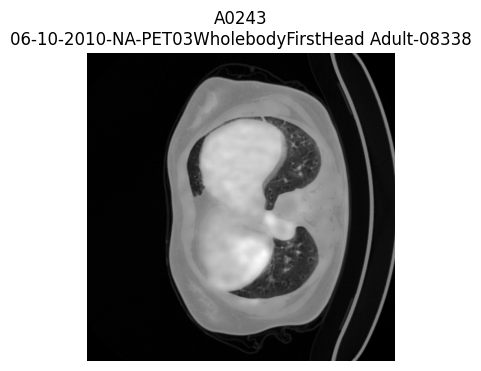


🔹 Échantillon 1:
  patient_id: A0243
  analysis_name: 06-10-2010-NA-PET03WholebodyFirstHead Adult-08338
  tStage: 1b
  nStage: 0
  mStage: 0
  histopatological_grading: G2


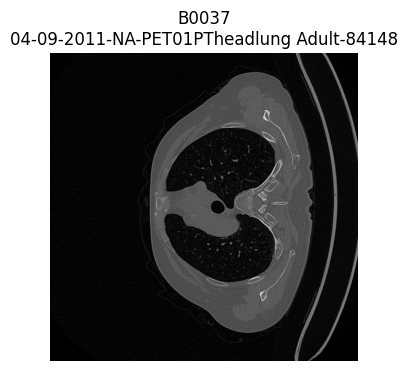


🔹 Échantillon 2:
  patient_id: B0037
  analysis_name: 04-09-2011-NA-PET01PTheadlung Adult-84148
  tStage: 1b
  nStage: 3
  mStage: 0
  histopatological_grading: nan


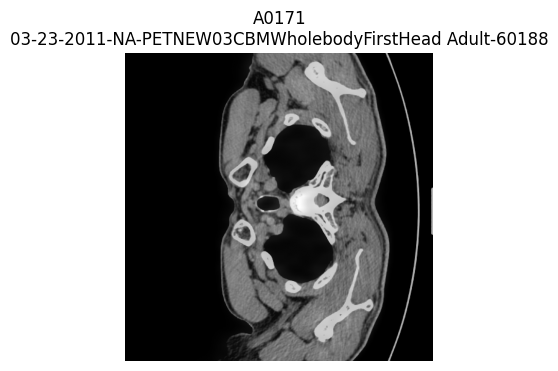


🔹 Échantillon 3:
  patient_id: A0171
  analysis_name: 03-23-2011-NA-PETNEW03CBMWholebodyFirstHead Adult-60188
  tStage: 2b
  nStage: 1
  mStage: 0
  histopatological_grading: nan


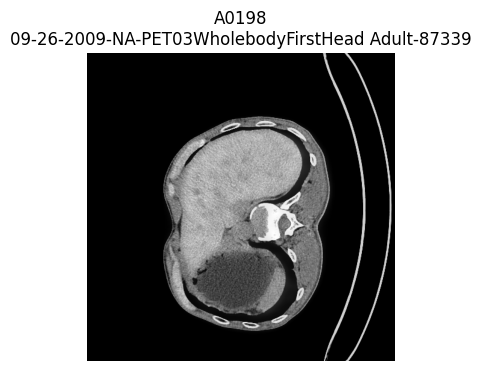


🔹 Échantillon 4:
  patient_id: A0198
  analysis_name: 09-26-2009-NA-PET03WholebodyFirstHead Adult-87339
  tStage: 2a
  nStage: 1
  mStage: 1
  histopatological_grading: nan


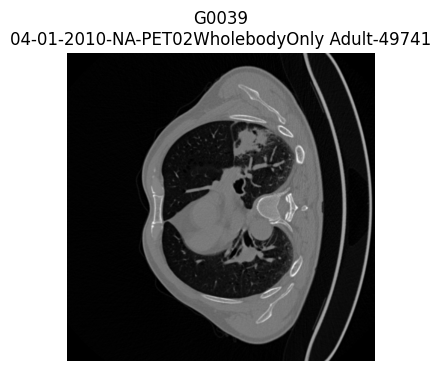


🔹 Échantillon 5:
  patient_id: G0039
  analysis_name: 04-01-2010-NA-PET02WholebodyOnly Adult-49741
  tStage: 3
  nStage: 0
  mStage: 0
  histopatological_grading: G2


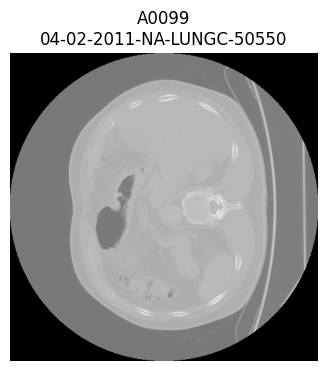


🔹 Échantillon 6:
  patient_id: A0099
  analysis_name: 04-02-2011-NA-LUNGC-50550
  tStage: 1c
  nStage: 1
  mStage: 0
  histopatological_grading: nan


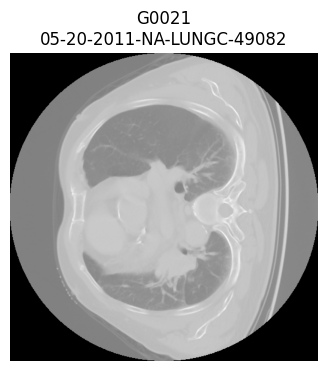


🔹 Échantillon 7:
  patient_id: G0021
  analysis_name: 05-20-2011-NA-LUNGC-49082
  tStage: 3
  nStage: 0
  mStage: 0
  histopatological_grading: nan


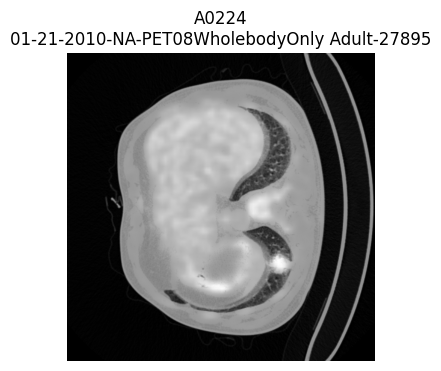


🔹 Échantillon 8:
  patient_id: A0224
  analysis_name: 01-21-2010-NA-PET08WholebodyOnly Adult-27895
  tStage: 1c
  nStage: 0
  mStage: 1
  histopatological_grading: G3
['A0251']
Nombre de patients sans diagnostic : 1


In [ ]:
batch = next(iter(data_dcm))
images = batch["image"]  # [B, C, H, W]
labels = batch["label"]
batch_size = len(images) # one patient can have multiple analysis, and one analysis can have multiple images

print(f"🧾 Batch size: {images.shape}")

for i in range(batch_size):
    img = images[i]  # [C, H, W]
    img_to_show = img[0].cpu().numpy()
    cmap = 'gray'

    plt.figure(figsize=(4, 4))
    plt.imshow(img_to_show, cmap=cmap)
    plt.axis('off')
    plt.title(f"{labels['patient_id'][i]}\n{labels['analysis_name'][i]}")
    plt.show()

    print(f"\n🔹 Sample {i+1}:")
    for key in labels:
        print(f"  {key}: {labels[key][i]}")

print(DicomDataset(valid_paths, diagnostic).missing_diagnostic)
print(f"Number of patients with missing diagnostic : {len(DicomDataset(valid_paths, diagnostic).missing_diagnostic)}")
